In [1]:
import os
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
%matplotlib inline


In [ ]:
#img_mean = (123.675, 116.28, 103.53)
# img_std = (58.395, 57.12, 57.375)
#img_std = (1., 1., 1.)

In [5]:
pwd

'/Users/home/Documents/Research/preprocessing'

In [6]:
ls

LE576_aug_train_test_split.ipynb  data_aug/
LEs576_star/                      dataset/
LEs576_star_coco/                 fits_crop_split_skymap.ipynb
SNR.ipynb                         labelme2coco.py
__pycache__/                      labelme2voc.py
albumentations.ipynb              labels.txt
ann.pdf                           labels2.txt
ann_largebox.pdf                  normalize.ipynb
atlas/                            prepare_dataset_yolov5.ipynb
cand1.csv                         texput.log
coco_mask.ipynb                   utils.py
coco_to_yolo.ipynb                viewbox.ipynb
cross_validation.ipynb


In [9]:
# directory to coco dataset
#dataset_dir = './dataset/LE_cand1_largebox_coco/'
dataset_dir = './dataset/LE_cand1_cls3_coco/'

train_dataset = CocoDataSet(dataset_dir=dataset_dir, readfits=False)

#test_dataset = CocoDataSet('../LEs920/', 'test',
#                                 flip_ratio=0.0,
#                                 pad_mode='fixed',
#                                 mean=img_mean,
#                                 std=img_std,
#                                 scale=(416, 416))

loading annotations into memory...
Done (t=0.00s)
creating index...
index created!


In [10]:
cat = train_dataset.get_categories()
cat

['bg', '_background_', 'LE', 'star', 'others']

In [11]:
len(train_dataset), #len(test_dataset)

(30,)

In [23]:
img, img_meta, bboxes, labels, imgpath = train_dataset[0]


./dataset/LE_cand1_largebox_coco//JPEGImages/005_8.jpg


In [24]:
img.shape

(576, 576, 3)

In [25]:
labels

array([2, 2, 3, 3, 3, 3, 2, 3, 3, 3, 2])

In [ ]:
imgpath

'./LEs576_new/tiles/LE_coco/JPEGImages/005_8.jpg'

In [ ]:
os.path.basename(imgpath)

'005_8.jpg'

In [ ]:
pwd

'/Users/home/Documents/Research/repos/TensorFlow-2.x-YOLOv3/preprocessing'

In [13]:
# prepare dataset annotation file for yolo
savetopath = "./dataset/LE_cand1_cls3/tiles/" # path to image


#annotfile = "/Users/home/Documents/Research/repos/TensorFlow-2.x-YOLOv3/dataset/LEs576aug/train.txt"

annotfile = "./dataset/LE_cand1_cls3/LE_all.txt"
with open(annotfile, 'w') as f:

    for image_num in range( len(train_dataset) ):
        print(image_num)
        img, img_meta, bboxes, labels, imgpath = train_dataset[image_num]
        imgname = os.path.basename(imgpath)
        #rgb_img = np.round(img + img_mean)

        #image_ann = os.path.join(savetopath, "%03d.jpg" %(image_num+1))
        image_ann = os.path.join(savetopath, imgname)
        
        #cv2.imwrite(image_ann, rgb_img)
        for i in range( len(bboxes)):
            y1, x1, y2, x2 = bboxes[i]
            y1, x1, y2, x2 = int(y1), int(x1), int(y2), int(x2)
            xmin = str(x1)
            ymin = str(y1)
            xmax = str(x2)
            ymax = str(y2)
            class_ind = str( int(labels[i]-2) )
            image_ann += ' ' + ','.join([xmin, ymin, xmax, ymax, str(class_ind)])
        f.write(image_ann + "\n")


0
./dataset/LE_cand1_cls3_coco/JPEGImages/005_8.jpg
1
./dataset/LE_cand1_cls3_coco/JPEGImages/009_8.jpg
2
./dataset/LE_cand1_cls3_coco/JPEGImages/003_2.jpg
3
./dataset/LE_cand1_cls3_coco/JPEGImages/010_6.jpg
4
./dataset/LE_cand1_cls3_coco/JPEGImages/014_1.jpg
5
./dataset/LE_cand1_cls3_coco/JPEGImages/018_1.jpg
6
./dataset/LE_cand1_cls3_coco/JPEGImages/001_2.jpg
7
./dataset/LE_cand1_cls3_coco/JPEGImages/014_0.jpg
8
./dataset/LE_cand1_cls3_coco/JPEGImages/003_4.jpg
9
./dataset/LE_cand1_cls3_coco/JPEGImages/006_7.jpg
10
./dataset/LE_cand1_cls3_coco/JPEGImages/013_5.jpg
11
./dataset/LE_cand1_cls3_coco/JPEGImages/017_3.jpg
12
./dataset/LE_cand1_cls3_coco/JPEGImages/006_6.jpg
13
./dataset/LE_cand1_cls3_coco/JPEGImages/002_1.jpg
14
./dataset/LE_cand1_cls3_coco/JPEGImages/017_0.jpg
15
./dataset/LE_cand1_cls3_coco/JPEGImages/004_4.jpg
16
./dataset/LE_cand1_cls3_coco/JPEGImages/006_5.jpg
17
./dataset/LE_cand1_cls3_coco/JPEGImages/002_2.jpg
18
./dataset/LE_cand1_cls3_coco/JPEGImages/011_6.jpg
19


./dataset/LE_cand1_cls3_coco/JPEGImages/005_8.jpg
./dataset/LE_cand1_cls3_coco/JPEGImages/009_8.jpg
./dataset/LE_cand1_cls3_coco/JPEGImages/003_2.jpg
./dataset/LE_cand1_cls3_coco/JPEGImages/010_6.jpg
./dataset/LE_cand1_cls3_coco/JPEGImages/014_1.jpg
./dataset/LE_cand1_cls3_coco/JPEGImages/018_1.jpg
./dataset/LE_cand1_cls3_coco/JPEGImages/001_2.jpg
./dataset/LE_cand1_cls3_coco/JPEGImages/014_0.jpg
./dataset/LE_cand1_cls3_coco/JPEGImages/003_4.jpg
./dataset/LE_cand1_cls3_coco/JPEGImages/006_7.jpg
./dataset/LE_cand1_cls3_coco/JPEGImages/013_5.jpg
./dataset/LE_cand1_cls3_coco/JPEGImages/017_3.jpg
./dataset/LE_cand1_cls3_coco/JPEGImages/006_6.jpg
./dataset/LE_cand1_cls3_coco/JPEGImages/002_1.jpg
./dataset/LE_cand1_cls3_coco/JPEGImages/017_0.jpg
./dataset/LE_cand1_cls3_coco/JPEGImages/004_4.jpg
./dataset/LE_cand1_cls3_coco/JPEGImages/006_5.jpg
./dataset/LE_cand1_cls3_coco/JPEGImages/002_2.jpg
./dataset/LE_cand1_cls3_coco/JPEGImages/011_6.jpg
./dataset/LE_cand1_cls3_coco/JPEGImages/007_0.jpg


/var/folders/pp/94p2lf0x2s53qs8cjp590jp80000gn/T/ipykernel_58859/377731153.py:45: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  _, ax = plt.subplots(1, figsize=figsize)


./dataset/LE_cand1_cls3_coco/JPEGImages/015_0.jpg
./dataset/LE_cand1_cls3_coco/JPEGImages/008_5.jpg
./dataset/LE_cand1_cls3_coco/JPEGImages/012_2.jpg
./dataset/LE_cand1_cls3_coco/JPEGImages/016_2.jpg
./dataset/LE_cand1_cls3_coco/JPEGImages/018_3.jpg
./dataset/LE_cand1_cls3_coco/JPEGImages/003_0.jpg
./dataset/LE_cand1_cls3_coco/JPEGImages/019_6.jpg
./dataset/LE_cand1_cls3_coco/JPEGImages/003_1.jpg
./dataset/LE_cand1_cls3_coco/JPEGImages/005_7.jpg


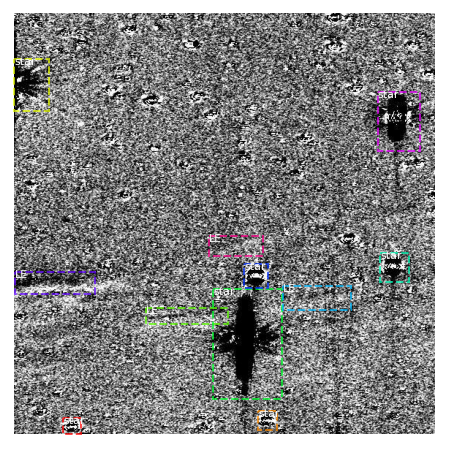

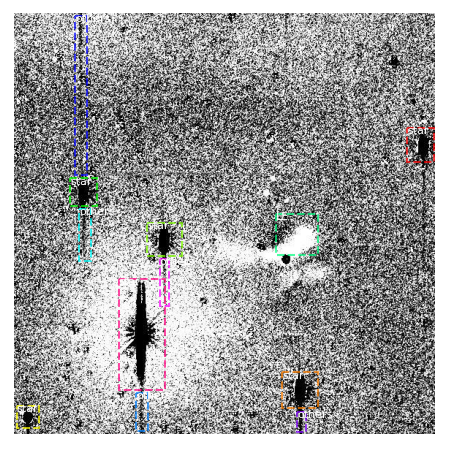

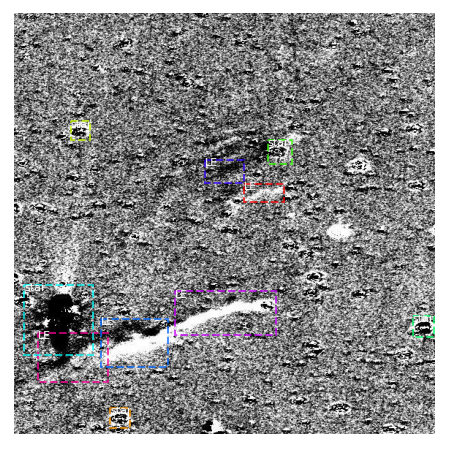

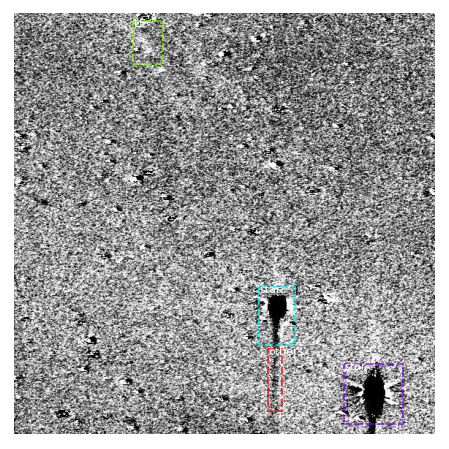

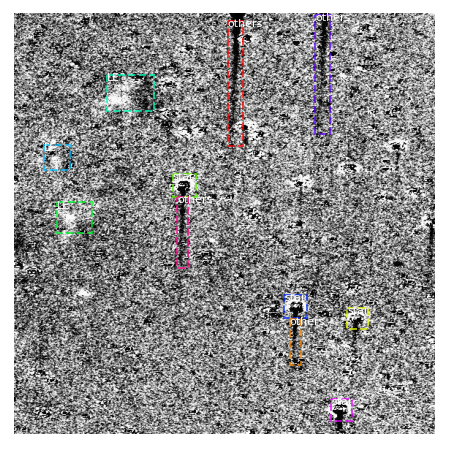

...

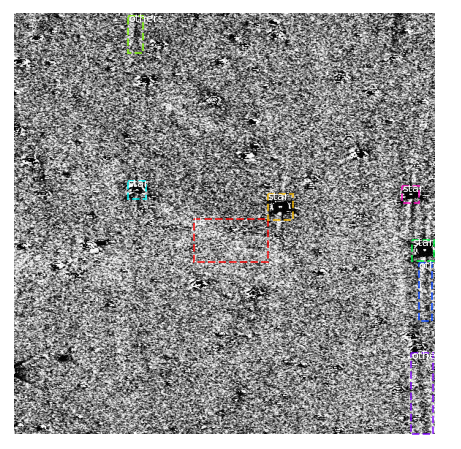

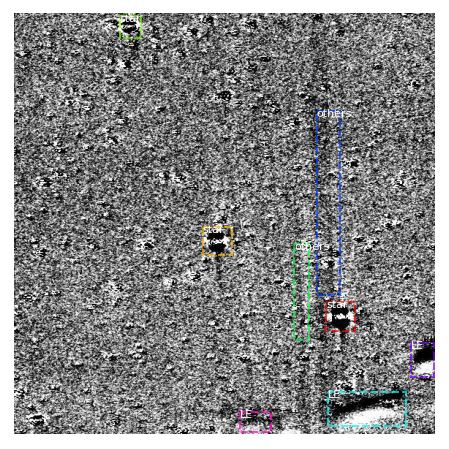

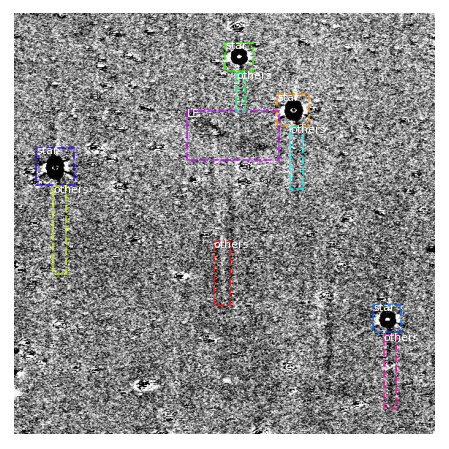

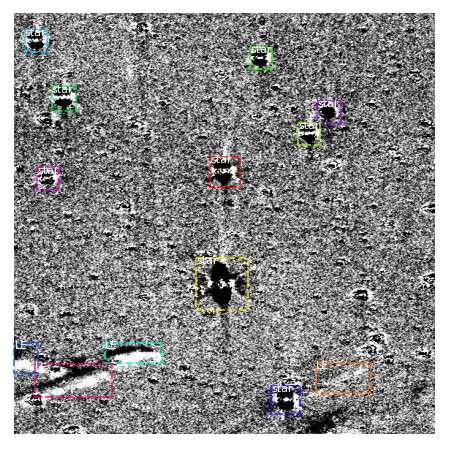

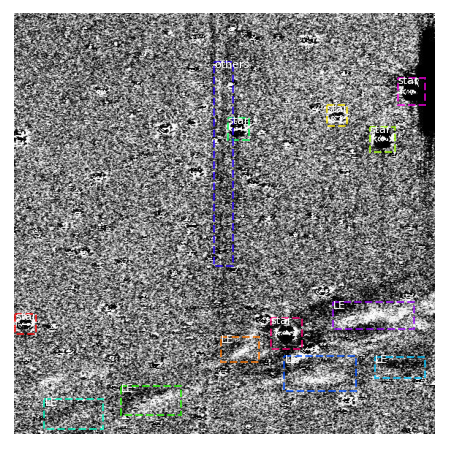

In [14]:
for idx in range( len(train_dataset) ):
    img, img_meta, bboxes, labels, _ = train_dataset[idx]
    #rgb_img = np.round(img + img_mean)
    display_instances(image=img, boxes=bboxes, 
                  class_ids=labels, class_names=cat, figsize=(8,8))

### visualize

In [12]:
import os
import sys
import random
import itertools
import colorsys

import numpy as np
from skimage.measure import find_contours

import matplotlib.pyplot as plt
from matplotlib import patches, lines
from matplotlib.patches import Polygon
# import IPython.display

def random_colors(N, bright=True):
    '''
    Generate random colors.
    To get visually distinct colors, generate them in HSV space then
    convert to RGB.
    '''
    brightness = 1.0 if bright else 0.7
    hsv = [(i / N, 1, brightness) for i in range(N)]
    colors = list(map(lambda c: colorsys.hsv_to_rgb(*c), hsv))
    random.shuffle(colors)
    return colors

def display_instances(image, boxes, class_ids, class_names,
                      scores=None, title="",
                      figsize=(16, 16), ax=None):
    '''
    boxes: [num_instance, (y1, x1, y2, x2, class_id)] in image coordinates.
    class_ids: [num_instances]
    class_names: list of class names of the dataset
    scores: (optional) confidence scores for each box
    figsize: (optional) the size of the image.
    '''
    # Number of instances
    N = boxes.shape[0]
    if not N:
        print("\n*** No instances to display *** \n")
    # else:
    #     assert boxes.shape[0] == masks.shape[-1] == class_ids.shape[0]

    if not ax:
        _, ax = plt.subplots(1, figsize=figsize)

    # Generate random colors
    colors = random_colors(N)

    # Show area outside image boundaries.
    height, width = image.shape[:2]
    ax.set_ylim(height + 10, -10)
    ax.set_xlim(-10, width + 10)
    ax.axis('off')
    ax.set_title(title)

    masked_image = image.astype(np.uint32).copy()
    for i in range(N):
        color = colors[i]

        # Bounding box
        if not np.any(boxes[i]):
            # Skip this instance. Has no bbox. Likely lost in image cropping.
            continue
        y1, x1, y2, x2 = boxes[i]
        y1, x1, y2, x2 = int(y1), int(x1), int(y2), int(x2)
        p = patches.Rectangle((x1, y1), x2 - x1, y2 - y1, linewidth=2,
                              alpha=0.7, linestyle="dashed",
                              edgecolor=color, facecolor='none')
        ax.add_patch(p)

        # Label
        class_id = class_ids[i]
        score = scores[i] if scores is not None else None
        label = class_names[class_id]
        x = random.randint(x1, (x1 + x2) // 2)
        caption = "{} {:.3f}".format(label, score) if score else label
        ax.text(x1, y1 + 8, caption,
                color='w', size=11, backgroundcolor="none")


    plt.imshow(image.astype(np.uint8))
    
def draw_boxes(image, boxes=None, refined_boxes=None,
               captions=None, visibilities=None,
               title="", ax=None):
    '''Draw bounding boxes and segmentation masks with differnt
    customizations.
    boxes: [N, (y1, x1, y2, x2, class_id)] in image coordinates.
    refined_boxes: Like boxes, but draw with solid lines to show
        that they're the result of refining 'boxes'.
    captions: List of N titles to display on each box
    visibilities: (optional) List of values of 0, 1, or 2. Determine how
        prominant each bounding box should be.
    title: An optional title to show over the image
    ax: (optional) Matplotlib axis to draw on.
    '''
    # Number of boxes
    N = boxes.shape[0] if boxes is not None else refined_boxes.shape[0]

    # Matplotlib Axis
    if not ax:
        _, ax = plt.subplots(1, figsize=(16, 16))

    # Generate random colors
    colors = random_colors(N)

    # Show area outside image boundaries.
    margin = image.shape[0] // 10
    ax.set_ylim(image.shape[0] + margin, -margin)
    ax.set_xlim(-margin, image.shape[1] + margin)
    ax.axis('off')

    ax.set_title(title)

    for i in range(N):
        # Box visibility
        visibility = visibilities[i] if visibilities is not None else 1
        if visibility == 0:
            color = "gray"
            style = "dotted"
            alpha = 0.5
        elif visibility == 1:
            color = colors[i]
            style = "dotted"
            alpha = 1
        elif visibility == 2:
            color = colors[i]
            style = "solid"
            alpha = 1

        # Boxes
        if boxes is not None:
            if not np.any(boxes[i]):
                # Skip this instance. Has no bbox. Likely lost in cropping.
                continue
            y1, x1, y2, x2 = boxes[i]
            p = patches.Rectangle((x1, y1), x2 - x1, y2 - y1, linewidth=2,
                                  alpha=alpha, linestyle=style,
                                  edgecolor=color, facecolor='none')
            ax.add_patch(p)

        # Refined boxes
        if refined_boxes is not None and visibility > 0:
            ry1, rx1, ry2, rx2 = refined_boxes[i].astype(np.int32)
            p = patches.Rectangle((rx1, ry1), rx2 - rx1, ry2 - ry1, linewidth=2,
                                  edgecolor=color, facecolor='none')
            ax.add_patch(p)
            # Connect the top-left corners of the anchor and proposal
            if boxes is not None:
                ax.add_line(lines.Line2D([x1, rx1], [y1, ry1], color=color))

        # Captions
        if captions is not None:
            caption = captions[i]
            # If there are refined boxes, display captions on them
            if refined_boxes is not None:
                y1, x1, y2, x2 = ry1, rx1, ry2, rx2
            x = random.randint(x1, (x1 + x2) // 2)
            ax.text(x1, y1, caption, size=11, verticalalignment='top',
                    color='w', backgroundcolor="none",
                    bbox={'facecolor': color, 'alpha': 0.5,
                          'pad': 2, 'edgecolor': 'none'})

    ax.imshow(image.astype(np.uint8))

### CocoDataSet

In [4]:
import os
import cv2
import numpy as np
from pycocotools.coco import COCO

class CocoDataSet(object):
    def __init__(self, dataset_dir, readfits=False):
        """load a dataset in COCO format"""
        self.dataset_dir = dataset_dir
        self.readfits = readfits
        self.coco = COCO('{}/annotations.json'.format(dataset_dir))
        
        
        # get the mapping from original category ids to labels
        self.cat_ids = self.coco.getCatIds()
        self.cat2label = {
            cat_id: i + 1
            for i, cat_id in enumerate(self.cat_ids)
        }
        
        self.img_ids, self.img_infos = self._filter_imgs()

    def _filter_imgs(self, min_size=32):
        '''Filter images too small or without ground truths.
        
        Args
        ---
            min_size: the minimal size of the image.
        '''
        # Filter images without ground truths.
        all_img_ids = list(set([_['image_id'] for _ in self.coco.anns.values()]))
        # Filter images too small.
        img_ids = []
        img_infos = []
        for i in all_img_ids:
            info = self.coco.loadImgs(i)[0]
            
            ann_ids = self.coco.getAnnIds(imgIds=i)
            ann_info = self.coco.loadAnns(ann_ids)
            ann = self._parse_ann_info(ann_info)
            
            if min(info['width'], info['height']) >= min_size and ann['labels'].shape[0] != 0:
                img_ids.append(i)
                img_infos.append(info)
        return img_ids, img_infos
        
    def _parse_ann_info(self, ann_info):
        '''Parse bbox annotation.
        
        Args
        ---
            ann_info (list[dict]): Annotation info of an image.
            
        Returns
        ---
            dict: A dict containing the following keys: bboxes, 
                bboxes_ignore, labels.
        '''
        gt_bboxes = []
        gt_labels = []
        gt_bboxes_ignore = []

        for i, ann in enumerate(ann_info):
            if ann.get('ignore', False):
                continue
            x1, y1, w, h = ann['bbox']
            if ann['area'] <= 0 or w < 1 or h < 1:
                continue
            bbox = [y1, x1, y1 + h - 1, x1 + w - 1]
            if ann['iscrowd']:
                gt_bboxes_ignore.append(bbox)
            else:
                gt_bboxes.append(bbox)
                gt_labels.append(self.cat2label[ann['category_id']])

        if gt_bboxes:
            gt_bboxes = np.array(gt_bboxes, dtype=np.float32)
            gt_labels = np.array(gt_labels, dtype=np.int64)
        else:
            gt_bboxes = np.zeros((0, 4), dtype=np.float32)
            gt_labels = np.array([], dtype=np.int64)

        if gt_bboxes_ignore:
            gt_bboxes_ignore = np.array(gt_bboxes_ignore, dtype=np.float32)
        else:
            gt_bboxes_ignore = np.zeros((0, 4), dtype=np.float32)

        ann = dict(
            bboxes=gt_bboxes, labels=gt_labels, bboxes_ignore=gt_bboxes_ignore)
        
        return ann
    
    def __len__(self):
        return len( self.coco.getImgIds() )
    
    def _load_ann_info(self, idx):
        img_id = self.img_ids[idx]
        ann_ids = self.coco.getAnnIds(imgIds=img_id)
        ann_info = self.coco.loadAnns(ann_ids)
        return ann_info

    def __getitem__(self, idx):
        '''Load the image and its bboxes for the given index.
        
        Args
        ---
            idx: the index of images.
            
        Returns
        ---
            tuple: A tuple containing the following items: image, 
                bboxes, labels.
        '''
        img_info = self.img_infos[idx]
        ann_info = self._load_ann_info(idx)
        
        if self.readfits:
            imgpath = os.path.join( self.dataset_dir, img_info['file_name'] )
            imgpath = imgpath.replace('jpg', 'npz') # change path to fits
            fitarr = np.load(imgpath)['fitsarr']
            img = np.repeat( np.expand_dims(fitarr, axis=2), repeats=3, axis=2)
            print(imgpath)
        else:
            # load the image.
            imgpath = os.path.join( self.dataset_dir, img_info['file_name'] )
            img = cv2.imread(imgpath, cv2.IMREAD_COLOR)
            img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
            
            print(imgpath)

        ori_shape = img.shape
        
        # Load the annotation.
        ann = self._parse_ann_info(ann_info)
        bboxes = ann['bboxes']
        labels = ann['labels']

        # Handle the meta info.
        img_meta_dict = dict({
            'ori_shape': ori_shape,
            'img_shape': ori_shape,
            'pad_shape': ori_shape,
            'scale_factor': 1,
            'flip': 0
        })

        img_meta = np.array(
            ori_shape +               # size=3
            ori_shape +               # size=3
            ori_shape +               # size=3
            tuple([img_meta_dict['scale_factor'] ]) +   # size=1
            tuple([img_meta_dict['flip'] ] )             # size=1
        ).astype(np.float32)

        
        return img, img_meta, bboxes, labels, imgpath
    
    def get_categories(self):
        '''Get list of category names. 
        
        Returns
        ---
            list: A list of category names.
            
        Note that the first item 'bg' means background.
        '''
        return ['bg'] + [self.coco.loadCats(i)[0]["name"] for i in self.cat2label.keys()]

        